# Beijing Multi-Site Air-Quality Data dataset

This hourly data set considers 6 main air pollutants and 6 relevant meteorological variables at multiple sites in Beijing.

This data set includes hourly air pollutants data from 12 nationally-controlled air-quality monitoring sites. The meteorological data in each air-quality site are matched with the nearest weather station. The time period is from March 1st, 2013 to February 28th, 2017. Missing data are denoted as NA.

| atribute    | note                                               |
|-------------|----------------------------------------------------|
| PM2.5       | PM2.5 concentration (ug/m^3)                       |
| PM10        | PM10 concentration (ug/m^3)                        |
| SO2         | SO2 concentration (ug/m^3)                         |
| NO2         | NO2 concentration (ug/m^3)                         |
| CO          | CO concentration (ug/m^3)                          |
| O3          | O3 concentration (ug/m^3)                          |
| PRES        | pressure (hPa)                                     |
| RAIN        | precipitation (mm)                                 |
| DEWP        | dew point temperature (degree Celsius)             |
| TEMP        | temperature (degree Celsius)                       |
| WSPM        | wind speed (m/s)                                   |
| wd          | wind direction                                     |
| station     | name of the air-quality monitoring site            |



Výskum tejto problematiky bol vykonaný aj v nasledujúcom článku:

*Zhang, S., Guo, B., Dong, A., He, J., Xu, Z. and Chen, S.X. (2017) Cautionary Tales on Air-Quality Improvement in Beijing. Proceedings of the Royal Society A, Volume 473, No. 2205, Pages 20170457.*

Z prieskumu témy sme zistili, že PM označuje *particle matter*, čiže kombináciu pevných častíc a kvapiek vo vzduchu. PM10 označuje väčšie častice, no oba druhy sú vdychovateľné a môžu spôsobiť zdravotné problémy. PM2.5 predstavujú najvyššie zdravotné riziko. 

Objektom skúmania teda bude PM2.5 a faktory, od ktorých závisia. Taktiež sme sa zamerali na stanicu Tiantan, ktorá meria ovzdušie v centre mesta, kde môže byť potenciálne najvyššie znečistenie.

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import scipy.stats as stats
import statsmodels.api as sm
import pylab as py
import os

from datetime import date
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_absolute_percentage_error

## Predpríprava dát
### Načítanie a úprava

In [126]:
filepaths = ["bonus_data/" + file for file in os.listdir("bonus_data")]
data = pd.concat(map(pd.read_csv, filepaths))
data.drop("No", axis=1, inplace=True);

data.head()

,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,2013,3,1,0,4.0,4.0,4.0,7.0,300.0,77.0,-0.7,1023.0,-18.8,0.0,NNW,4.4,Aotizhongxin
1,2013,3,1,1,8.0,8.0,4.0,7.0,300.0,77.0,-1.1,1023.2,-18.2,0.0,N,4.7,Aotizhongxin
2,2013,3,1,2,7.0,7.0,5.0,10.0,300.0,73.0,-1.1,1023.5,-18.2,0.0,NNW,5.6,Aotizhongxin
3,2013,3,1,3,6.0,6.0,11.0,11.0,300.0,72.0,-1.4,1024.5,-19.4,0.0,NW,3.1,Aotizhongxin
4,2013,3,1,4,3.0,3.0,12.0,12.0,300.0,72.0,-2.0,1025.2,-19.5,0.0,N,2.0,Aotizhongxin


In [127]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 420768 entries, 0 to 35063
Data columns (total 17 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   year     420768 non-null  int64  
 1   month    420768 non-null  int64  
 2   day      420768 non-null  int64  
 3   hour     420768 non-null  int64  
 4   PM2.5    412029 non-null  float64
 5   PM10     414319 non-null  float64
 6   SO2      411747 non-null  float64
 7   NO2      408652 non-null  float64
 8   CO       400067 non-null  float64
 9   O3       407491 non-null  float64
 10  TEMP     420370 non-null  float64
 11  PRES     420375 non-null  float64
 12  DEWP     420365 non-null  float64
 13  RAIN     420378 non-null  float64
 14  wd       418946 non-null  object 
 15  WSPM     420450 non-null  float64
 16  station  420768 non-null  object 
dtypes: float64(11), int64(4), object(2)
memory usage: 57.8+ MB


#### Null hodnoty

In [128]:
data.isnull().sum()

year           0
month          0
day            0
hour           0
PM2.5       8739
PM10        6449
SO2         9021
NO2        12116
CO         20701
O3         13277
TEMP         398
PRES         393
DEWP         403
RAIN         390
wd          1822
WSPM         318
station        0
dtype: int64

In [129]:
data.shape[0] - data.dropna().shape[0]

38600

NA hodnoty sú v 38600 riadkoch. Rozhodneme o tom, či NA hodnoty atribútu odstránime alebo ich spriemerujeme - ak je NA hodnôt menej ako 1%, zmažú sa.

In [130]:
attr = set(data.columns)
init_size = data.shape[0]

for a in attr:
    if 0 < data[a].isnull().sum() < data.shape[0] * 0.01:
        data.dropna(subset=[a], inplace=True)
    elif 0 < data[a].isnull().sum():
        mean = data[a].mean()
        data[a].fillna(mean, inplace=True)

print("Odstránených bolo %d riadkov" % (init_size - data.shape[0]))

data = data.reset_index()
data.drop('index', axis=1, inplace=True)

data.isnull().sum().sum()

Odstránených bolo 1910 riadkov


0

In [131]:
data.duplicated().sum()

0

In [132]:
data.describe()

,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM
count,418858.000000,418858.000000,418858.000000,418858.000000,418858.000000,418858.000000,418858.00000,418858.000000,418858.000000,418858.000000,418858.000000,418858.000000,418858.000000,418858.000000,418858.000000
mean,2014.657039,6.524610,15.722273,11.502722,79.709022,104.541006,15.84451,50.596046,1228.902498,57.502882,13.562796,1010.732098,2.493081,0.064609,1.734993
std,1.175590,3.444962,8.801802,6.916863,79.947504,91.052988,21.43823,34.604780,1129.877517,55.804384,11.434838,10.475351,13.800842,0.822399,1.244678
min,2013.000000,1.000000,1.000000,0.000000,2.000000,2.000000,0.28560,1.026500,100.000000,0.214200,-19.900000,982.400000,-36.000000,0.000000,0.000000
25%,2014.000000,4.000000,8.000000,6.000000,21.000000,36.000000,3.00000,24.000000,500.000000,12.000000,3.200000,1002.200000,-8.900000,0.000000,0.900000
50%,2015.000000,7.000000,16.000000,12.000000,57.000000,84.000000,8.00000,45.000000,900.000000,47.000000,14.500000,1010.400000,3.100000,0.000000,1.400000
75%,2016.000000,10.000000,23.000000,17.000000,109.000000,144.000000,19.00000,70.000000,1500.000000,80.000000,23.300000,1019.000000,15.100000,0.000000,2.200000
max,2017.000000,12.000000,31.000000,23.000000,999.000000,999.000000,500.00000,290.000000,10000.000000,1071.000000,41.600000,1042.800000,29.100000,72.500000,13.200000


Zatiaľ si zachováme všetky stĺpce - neparsujeme dátum, možno každá hodina bude zaujímavá. Pri EDE zatiaľ zachováme aj nenumerické hodnoty.

## Vizualizácia dát

NE     43322
ENE    34142
NW     32573
N      30869
E      29752
SW     28728
NNE    28232
NNW    25326
WNW    24374
ESE    24219
SSW    22563
SE     20058
WSW    20040
S      19404
SSE    17694
W      17562
Name: wd, dtype: int64

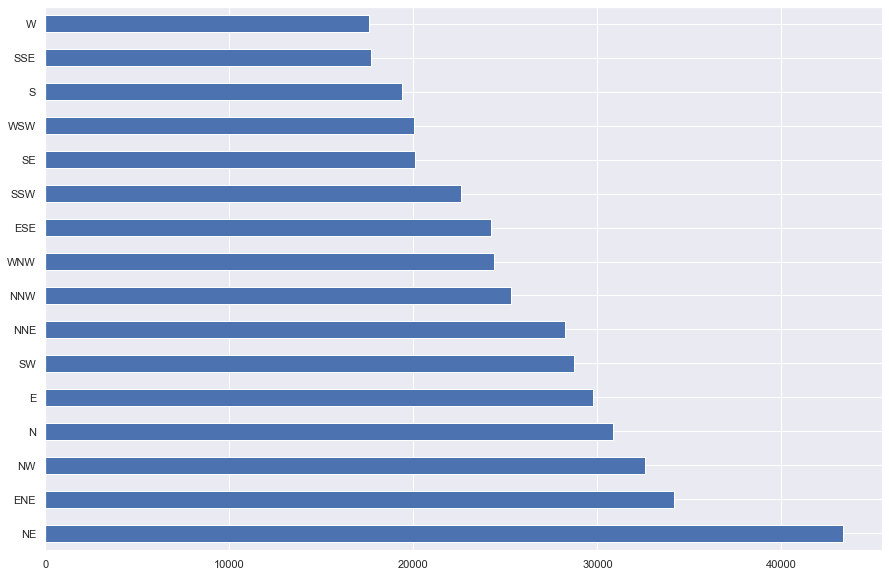

In [133]:
data.wd.value_counts().plot(kind='barh')
data.wd.value_counts()

Dongsi           34980
Nongzhanguan     34980
Tiantan          34980
Wanshouxigong    34979
Aotizhongxin     34977
Guanyuan         34977
Wanliu           34935
Changping        34913
Dingling         34913
Gucheng          34898
Huairou          34754
Shunyi           34572
Name: station, dtype: int64

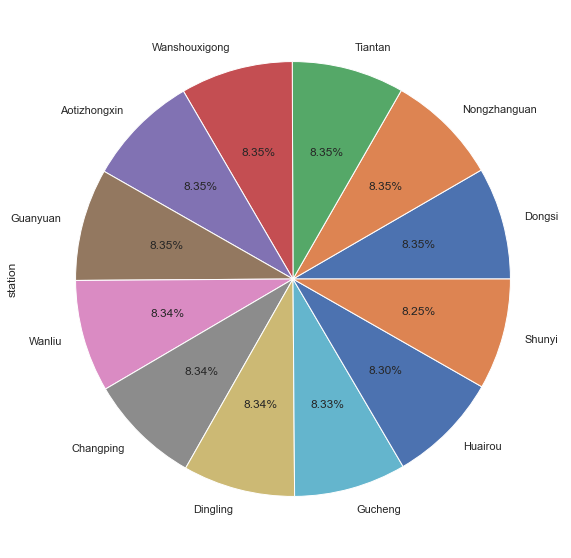

In [134]:
data.station.value_counts().plot(kind='pie', autopct='%.2f%%')
data.station.value_counts()

array([[<AxesSubplot:title={'center':'PM2.5'}>,
        <AxesSubplot:title={'center':'NO2'}>,
        <AxesSubplot:title={'center':'O3'}>],
       [<AxesSubplot:title={'center':'PM10'}>,
        <AxesSubplot:title={'center':'RAIN'}>,
        <AxesSubplot:title={'center':'WSPM'}>],
       [<AxesSubplot:title={'center':'PRES'}>,
        <AxesSubplot:title={'center':'TEMP'}>,
        <AxesSubplot:title={'center':'SO2'}>],
       [<AxesSubplot:title={'center':'DEWP'}>,
        <AxesSubplot:title={'center':'CO'}>, <AxesSubplot:>]],
      dtype=object)

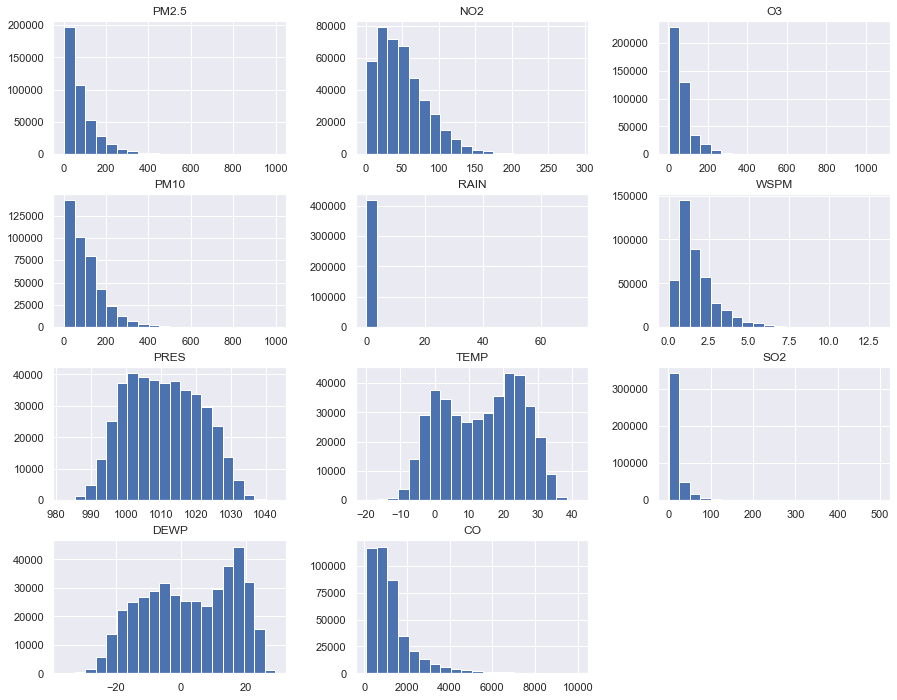

In [135]:
attr = set(data.columns) - {'station', 'wd', 'year', 'month', 'day', 'hour'}
attr = list(attr)

data[attr].hist(figsize=(15,12), bins=20)

<AxesSubplot:>

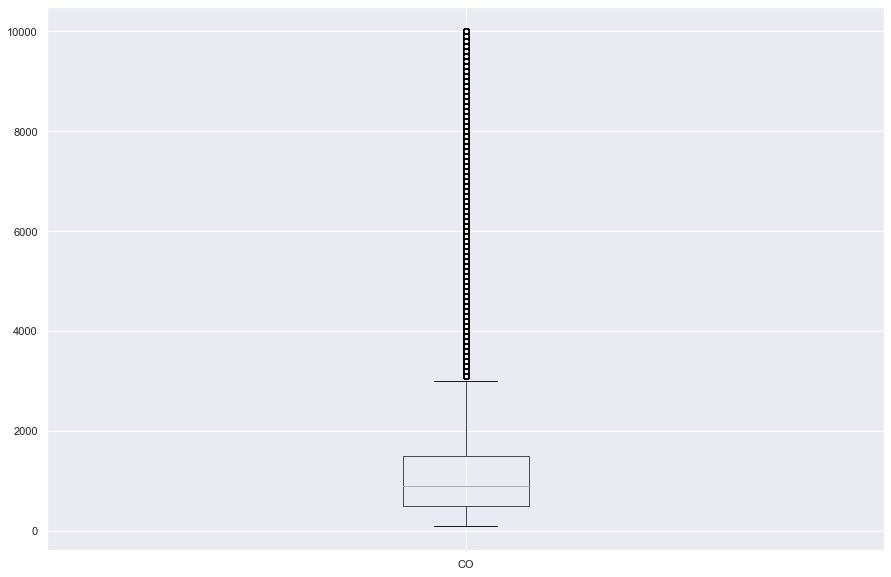

In [136]:
data.boxplot(column="CO")

<AxesSubplot:>

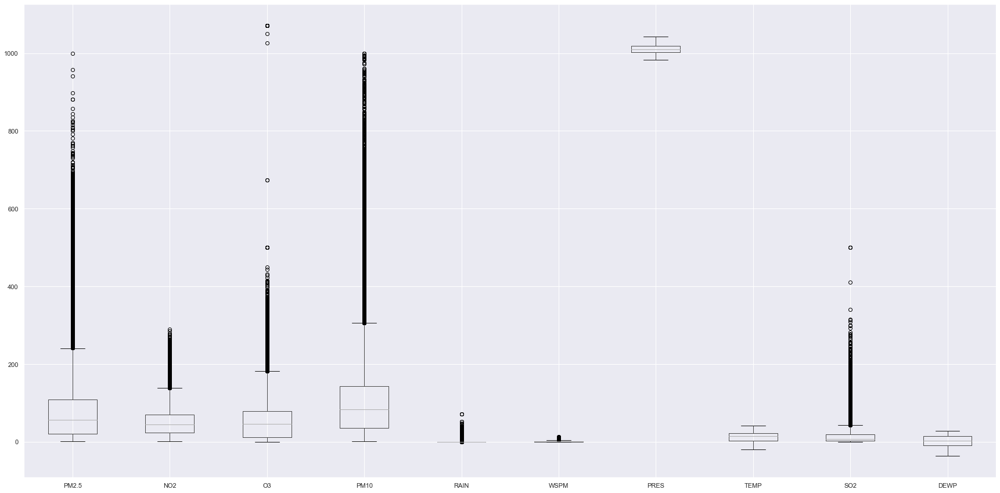

In [137]:
attr.remove("CO")
data[attr].boxplot(figsize=(30,15))

<AxesSubplot:title={'center':'Mean'}>

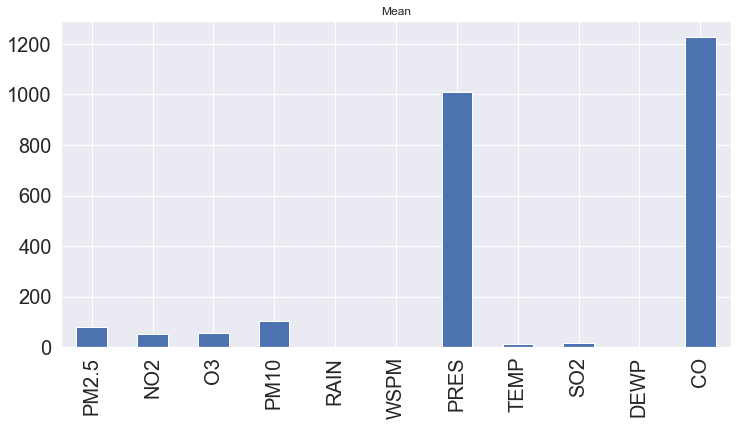

In [138]:
attr.append("CO")
data[attr].mean(numeric_only=True).plot(kind='bar', figsize=(12,6), fontsize=20, title="Mean")

<AxesSubplot:title={'center':'Standard deviation'}>

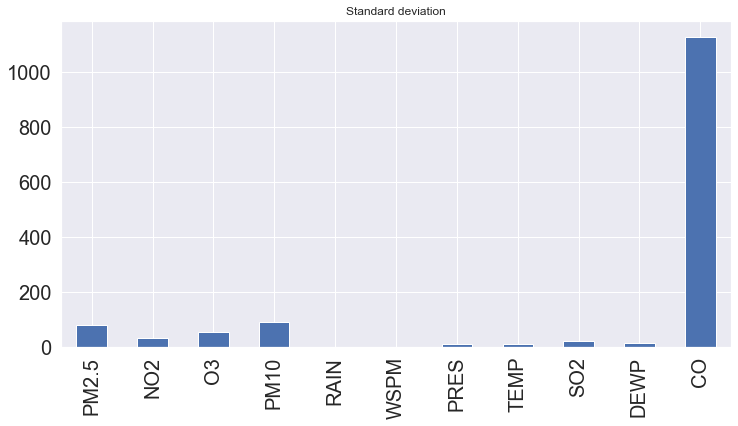

In [139]:
data[attr].std(numeric_only=True).plot(kind='bar', figsize=(12,6), fontsize=20, title="Standard deviation")

Text(0.5, 1.0, 'Highly positively skewed: Skewness 1341.20668')

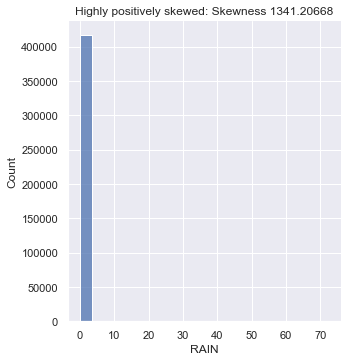

In [140]:
sns.displot(data['RAIN'])
plt.title("Highly positively skewed: ""Skewness %.5f" % (stats.kurtosis(data['RAIN']), ))

<AxesSubplot:title={'center':'Skewness'}>

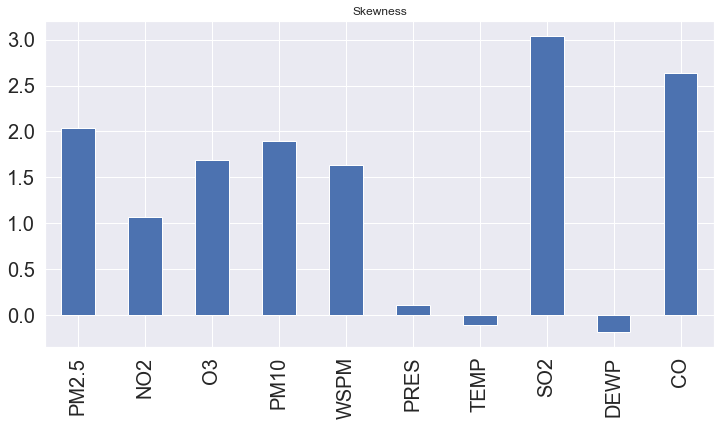

In [70]:
attr.remove("RAIN")
data[attr].skew(numeric_only=True).plot(kind='bar', figsize=(12,6), fontsize=20, title="Skewness")

In [71]:
stats.kurtosis(data['RAIN'], fisher=False)

1344.2066759027416

Normálne rozdelenie má hodnotu kurtosis 3. Hodnoty v stĺpci RAIN sú sústredené okolo jedného bodu na ľavom okraji. Viacero dát má tento problém.

<AxesSubplot:title={'center':'Kurtosis'}>

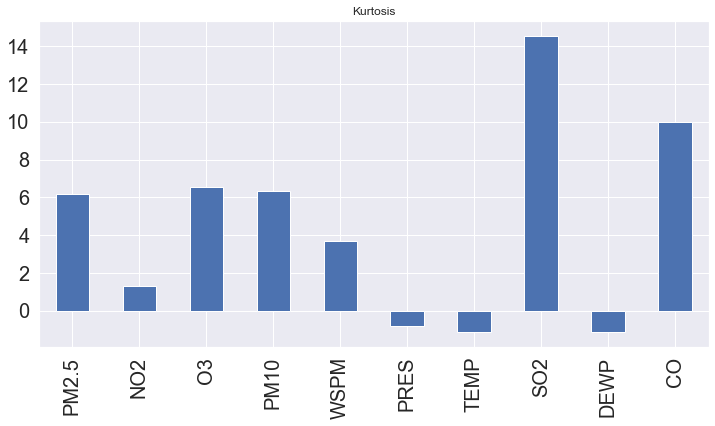

In [72]:
bezalt = data[attr]
bezalt.kurtosis(numeric_only=True).plot(kind='bar', figsize=(12,6), fontsize=20, title="Kurtosis")

## Párová analýza dát

### Korelácia dát:

<AxesSubplot:>

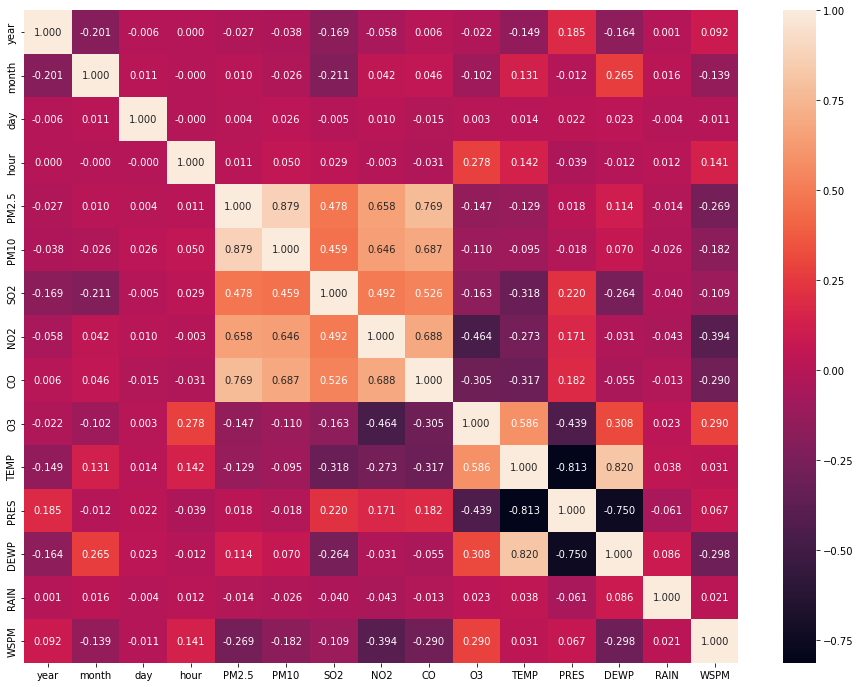

In [20]:
fig, ax = plt.subplots(figsize=(16,12))
sns.heatmap(data.corr(), ax=ax, annot=True, fmt=".3f")

Najznačnejšia kladná korelácia je medzi *PM10* a *PM2.5* a záporná medzi *PRES* a *TEMP*.

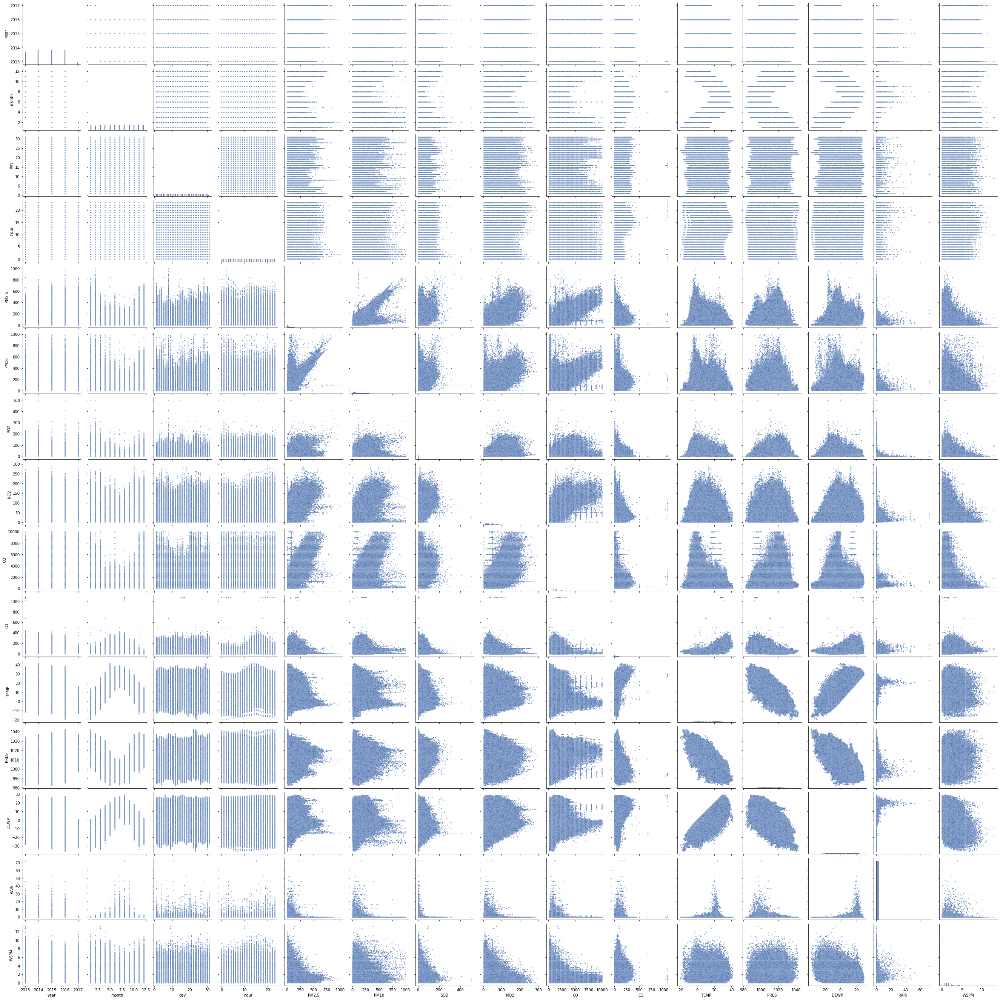

In [24]:
sns.set_palette('deep')
sns.pairplot(data, plot_kws={"s": 4})

Pairplot pre vybranú stanicu podľa smeru vetra:

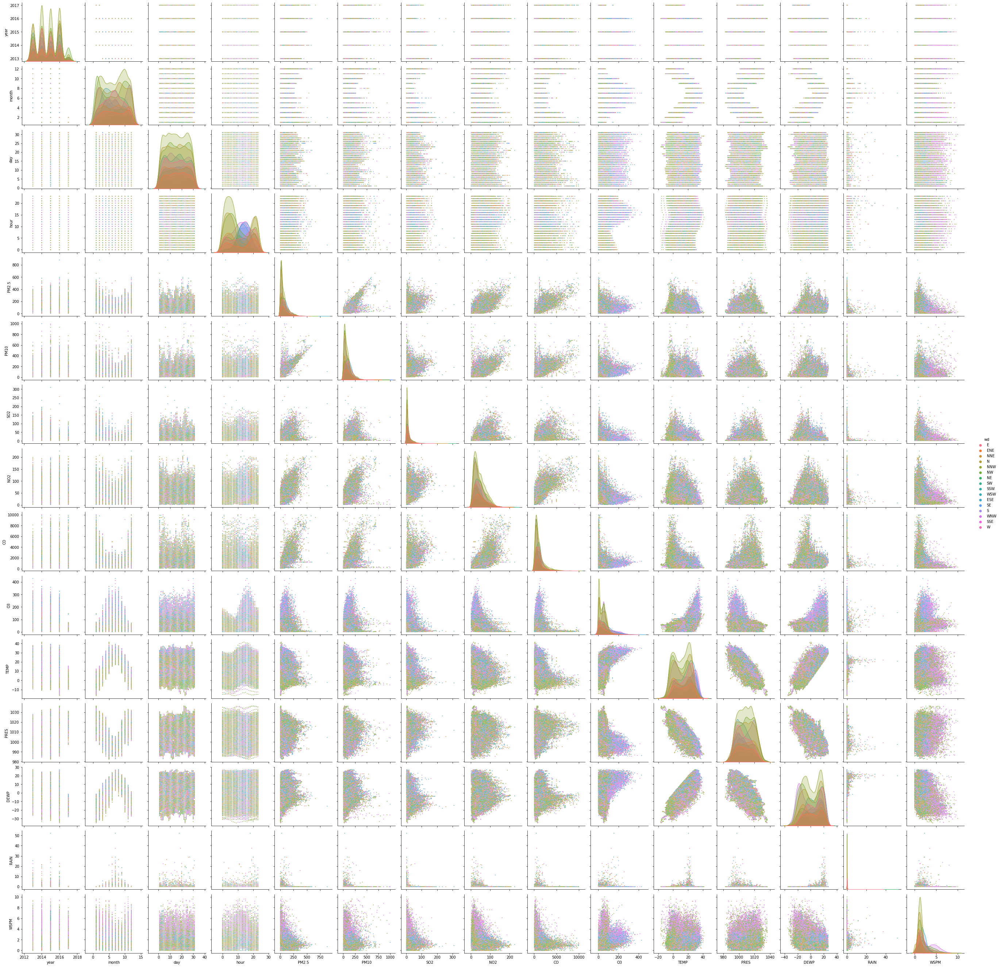

In [23]:
sns.set_palette('deep')
sns.pairplot(data.loc[data['station'] == 'Changping'], plot_kws={"s": 4}, hue="wd")

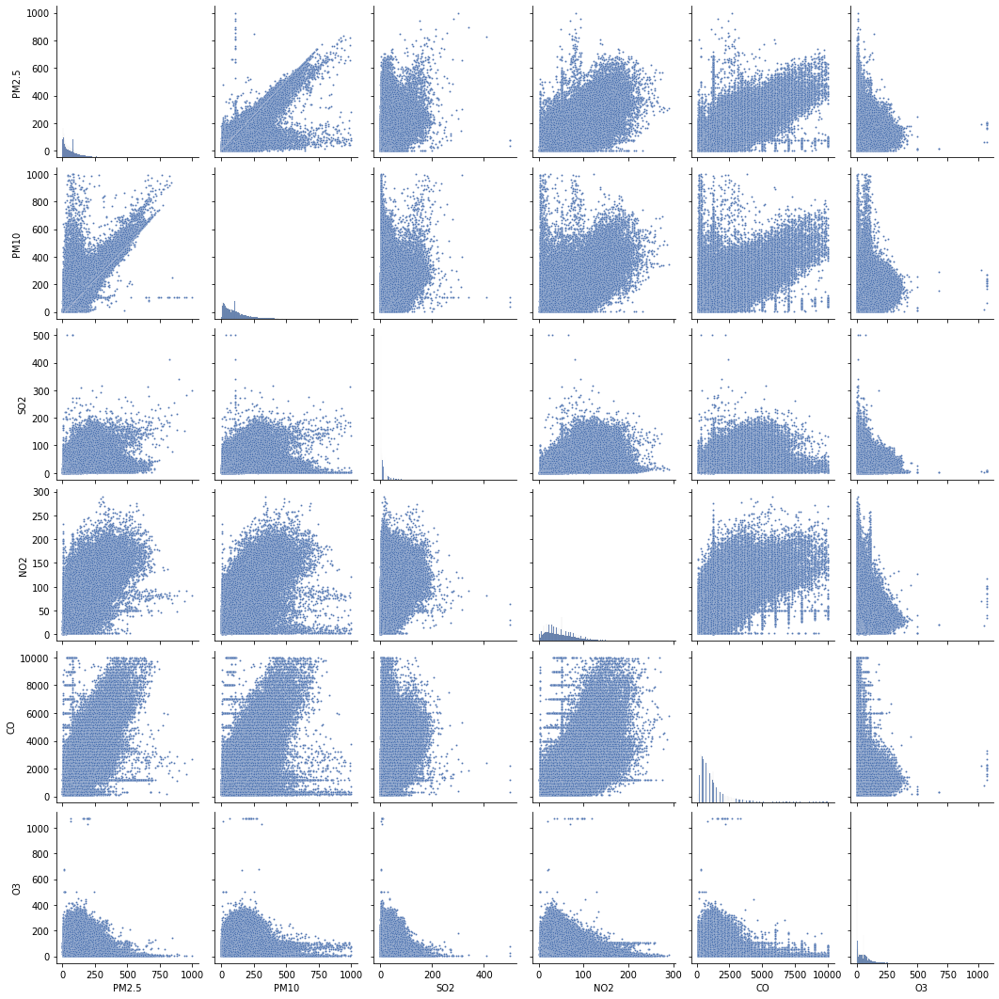

In [21]:
sns.set_palette('deep')
sns.pairplot(data, vars = ['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3'], plot_kws={"s": 4})

<AxesSubplot:xlabel='PM2.5', ylabel='CO'>

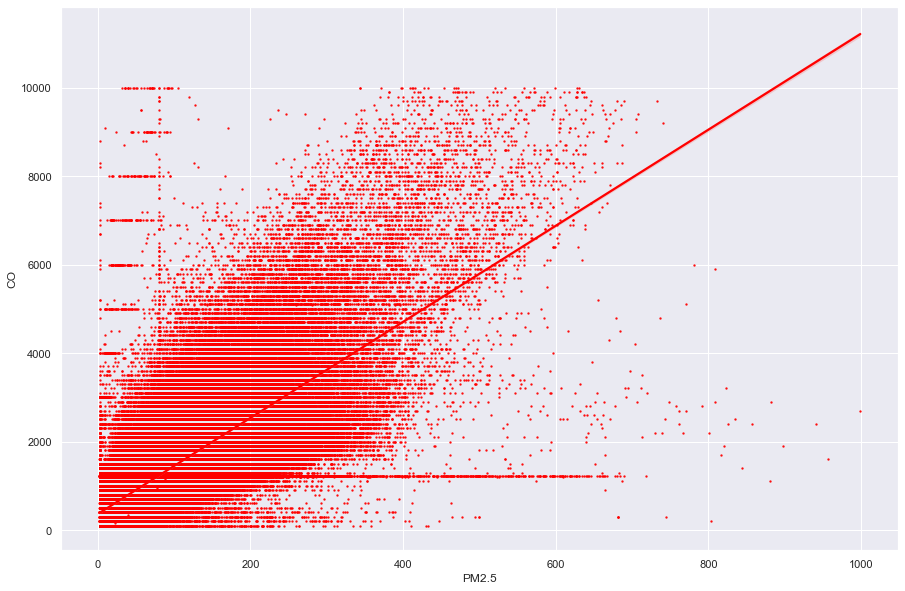

In [27]:
sns.set(rc={'figure.figsize':(15,10)})
sns.regplot(data=data, x="PM2.5", y="CO", color='red', scatter_kws={'s':2})

<AxesSubplot:xlabel='PM2.5', ylabel='SO2'>

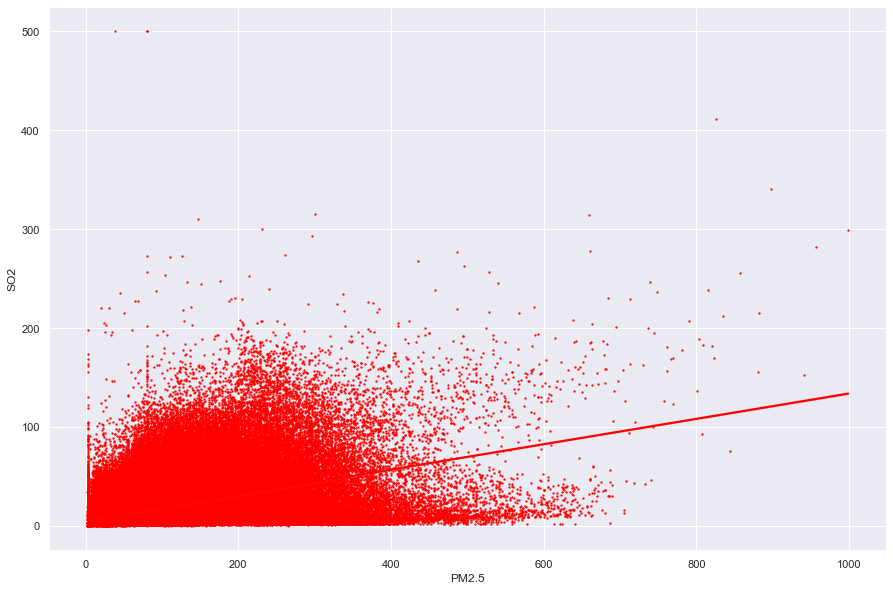

In [28]:
sns.regplot(data=data, x="PM2.5", y="SO2", color='red', scatter_kws={'s':2})

Vyobrazenie pairplotu iba pre stanicu Tiantan. Z tohto môžeme vidieť, že lineárne súvisia *PM2.5* a *CO*, a *PM2.5* a *NO2*

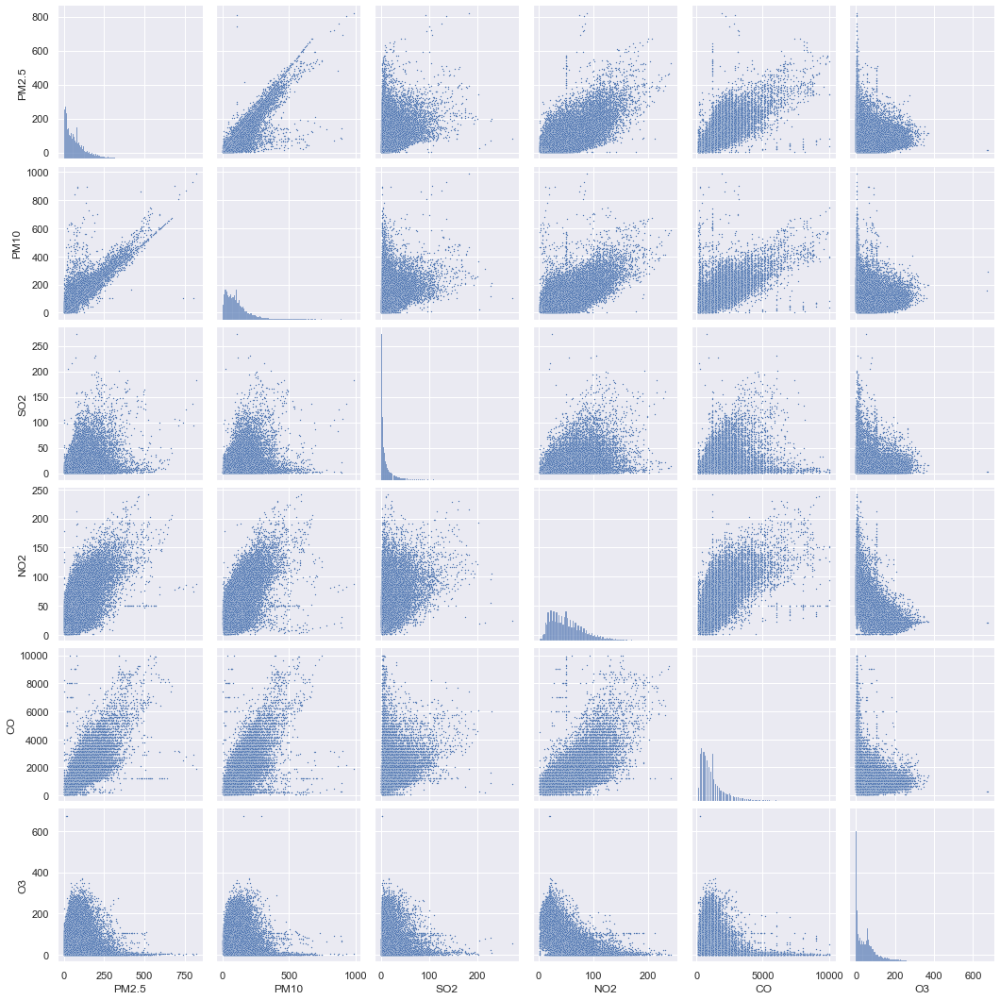

In [30]:
sns.set_palette('deep')
sns.pairplot(data.loc[data['station'] == 'Tiantan'], vars = ['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3'], plot_kws={"s": 2})

<AxesSubplot:xlabel='CO', ylabel='PM2.5'>

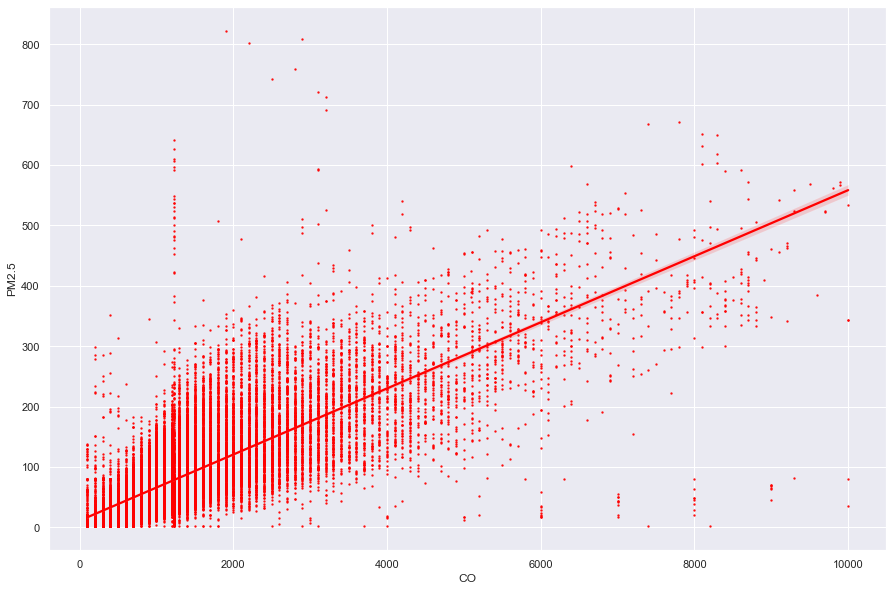

In [223]:
sns.regplot(data=data.loc[data['station'] == 'Tiantan'], x="CO", y="PM2.5", color='red', scatter_kws={'s':2})

<AxesSubplot:xlabel='NO2', ylabel='PM2.5'>

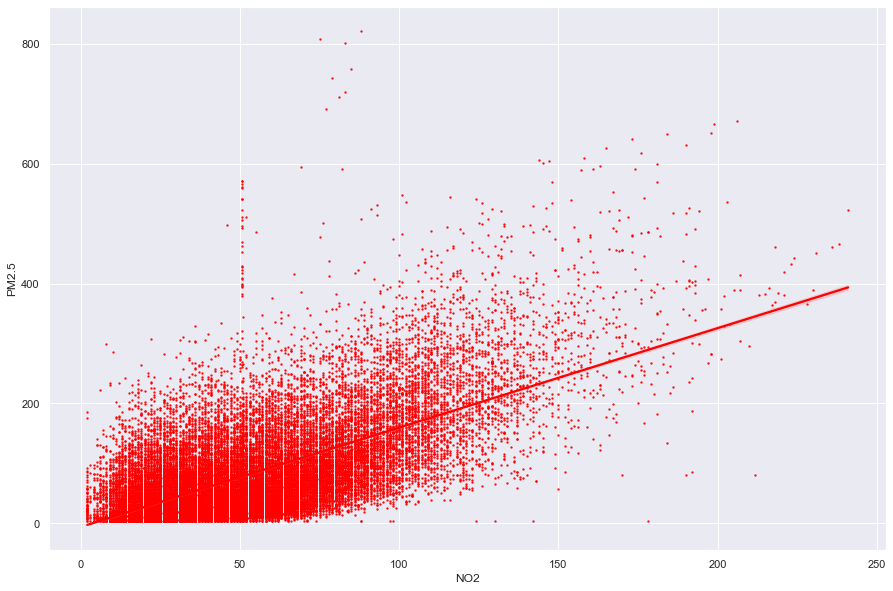

In [224]:
sns.regplot(data=data.loc[data['station'] == 'Tiantan'], x="NO2", y="PM2.5", color='red', scatter_kws={'s':2})

In [251]:
dataTian = data.loc[data['station'] == 'Tiantan']

In [252]:
dataTian

,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
313964,2013,3,1,0,6.0,6.0,4.0,8.000000,300.0,81.000000,-0.5,1024.5,-21.4,0.0,NNW,5.7,Tiantan
313965,2013,3,1,1,6.0,29.0,5.0,9.000000,300.0,80.000000,-0.7,1025.1,-22.1,0.0,NW,3.9,Tiantan
313966,2013,3,1,2,6.0,6.0,4.0,12.000000,300.0,75.000000,-1.2,1025.3,-24.6,0.0,NNW,5.3,Tiantan
313967,2013,3,1,3,6.0,6.0,4.0,12.000000,300.0,74.000000,-1.4,1026.2,-25.5,0.0,N,4.9,Tiantan
313968,2013,3,1,4,5.0,5.0,7.0,15.000000,400.0,70.000000,-1.9,1027.1,-24.5,0.0,NNW,3.2,Tiantan
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
348939,2017,2,28,19,20.0,48.0,2.0,50.638586,500.0,57.372271,12.5,1013.5,-16.2,0.0,NW,2.4,Tiantan
348940,2017,2,28,20,11.0,34.0,3.0,36.000000,500.0,57.372271,11.6,1013.6,-15.1,0.0,WNW,0.9,Tiantan
348941,2017,2,28,21,18.0,32.0,4.0,48.000000,500.0,48.000000,10.8,1014.2,-13.3,0.0,NW,1.1,Tiantan
348942,2017,2,28,22,15.0,42.0,5.0,52.000000,600.0,44.000000,10.5,1014.4,-12.9,0.0,NNW,1.2,Tiantan


### Hypotéza

Na základe zobrazených dát sa dá predikovať znečistenie ovzdušia PM2.5 škodlivé pre človeka s úrovňou NO2 a Co nameranou vo vzduchu.

**$H_0$** Hodnota PM2.5 je vyššia pokiaľ sú hodnoty NO2 a CO vyššie.

**$H_1$** Hodnota PM2.5 sa nemení s hodnotami NO2 a CO.

In [207]:
def calculate_smape(actual, predicted) -> float:
  
    # Convert actual and predicted to numpy
    # array data type if not already
    if not all([isinstance(actual, np.ndarray), 
                isinstance(predicted, np.ndarray)]):
        actual, predicted = np.array(actual),
        np.array(predicted)
  
    return round(
        np.mean(
            np.abs(predicted - actual) / 
            ((np.abs(predicted) + np.abs(actual))/2)
        )*100, 2
    )

In [242]:
def percentage_error(actual, predicted):
    res = np.empty(actual.shape)
    for j in range(actual.shape[0]):
        if actual[j] != 0:
            res[j] = (actual[j] - predicted[j]) / actual[j]
        else:
            res[j] = predicted[j] / np.mean(actual)
    return res

def mean_absolute_percentage_error_funct(y_true, y_pred): 
    return np.mean(np.abs(percentage_error(np.asarray(y_true), np.asarray(y_pred))))

In [267]:
y = dataTian['PM2.5'].values
# X = dataTian['CO'].values
# X = X.reshape((len(X),1))

X = dataTian[['NO2','CO']]
    
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=1)
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(27984, 2) (6996, 2) (27984,) (6996,)


In [268]:
model = LinearRegression()
model.fit(X_train, y_train)

LinearRegression()

In [269]:
print('intercept:', model.intercept_)
print('slope:', model.coef_)

intercept: -3.3556131846600294
slope: [0.51195581 0.04502591]


In [270]:
y_pred = model.predict(X_test)

In [271]:
r_sq = model.score(X_train, y_train)
print('(r2 score) coefficient of determination:', r_sq)
print('Coefficient of determination : %.2f' % r2_score(y_test, y_pred))

(r2 score) coefficient of determination: 0.6375015498802292
Coefficient of determination : 0.64


In [272]:
print(mean_squared_error(y_test, y_pred))      # RMSE
print(mean_absolute_error(y_test, y_pred))     # MAE

2273.692503003758
32.776268679585996


In [274]:
print(mean_absolute_percentage_error(y_pred, y_test))     # MAPE
print(mean_absolute_percentage_error_funct(y_pred, y_test))     # MAPE
print(calculate_smape(y_test, y_pred)/100)                #SMAPE

0.4768334474364025
0.4768334474364025
0.5125


Presnosť modelu je približne 64% a chybovosť modelu je buď 48% alebo 51% takžie niečo okolo 50%. Týmto nemáme dostatok na potvrdenie H0 a zamietame ju v prospech H1.